# DeepFool

This notebook demonstrates the generation of adversarial examples using the DeepFool attack against pre-trained Convolutional Neural Networks (CNNs).

DeepFool is an untargeted, iterative adversarial attack designed to find the minimal perturbation required to change a classifier's decision. It works by linearizing the decision boundaries of the neural network around the current image and iteratively projecting the image towards the closest boundary until a misclassification occurs. The `overshoot` parameter provides a slight extra push to guarantee the boundary is crossed.

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Import models
from tensorflow.keras.applications import EfficientNetB0, InceptionV3, MobileNetV2

# Import specific preprocessing and decoding functions
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_eff, decode_predictions as decode_eff
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_inc, decode_predictions as decode_inc
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as preprocess_mob, decode_predictions as decode_mob

### Setup Models and Images
We configure the `clip_min` and `clip_max` values to ensure the adversarial image remains within the valid input space of each respective model after the DeepFool perturbations.

In [2]:
# Helper functions for denormalization based on model preprocessing
def denormalize_eff(img):
    # EfficientNet uses [0, 255] range
    img = tf.clip_by_value(img, 0, 255)
    return img.numpy().squeeze().astype("uint8")

def denormalize_neg1_1(img):
    # MobileNetV2 and InceptionV3 use [-1, 1] range
    img = (img + 1.0) / 2.0 # Convert to [0, 1]
    img = img * 255.0 # Convert to [0, 255]
    img = tf.clip_by_value(img, 0, 255)
    return img.numpy().squeeze().astype("uint8")

# Dictionary with model configurations
models_dict = {
    'MobileNetV2': {
        'model': MobileNetV2(weights='imagenet'),
        'target_size': (224, 224),
        'preprocess_fn': preprocess_mob,
        'decode_fn': decode_mob,
        'denormalize_fn': denormalize_neg1_1,
        'clip_min': -1.0,
        'clip_max': 1.0
    },
    'EfficientNetB0': {
        'model': EfficientNetB0(weights='imagenet'),
        'target_size': (224, 224),
        'preprocess_fn': preprocess_eff,
        'decode_fn': decode_eff,
        'denormalize_fn': denormalize_eff,
        'clip_min': 0.0,
        'clip_max': 255.0
    },
    'InceptionV3': {
        'model': InceptionV3(weights='imagenet'),
        'target_size': (299, 299),
        'preprocess_fn': preprocess_inc,
        'decode_fn': decode_inc,
        'denormalize_fn': denormalize_neg1_1,
        'clip_min': -1.0,
        'clip_max': 1.0
    }
}

# Freeze weights as we only need to perform inference and compute gradients w.r.t inputs
for config in models_dict.values():
    config['model'].trainable = False

# Dictionary for target images
images_dict = {
    'Dog': '../../images/dog.png',
    'Lion': '../../images/lion.png'
}

In [3]:
def load_and_preprocess_image(img_path, target_size, preprocess_fn):
    img_raw = tf.io.read_file(img_path)
    img = tf.image.decode_image(img_raw, channels=3)
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, target_size)
    img = preprocess_fn(img) # Dynamic preprocessing
    img = tf.expand_dims(img, axis=0) # Add batch dimension
    return img

def get_imagenet_label(prob, decode_fn):
    return decode_fn(prob, top=1)[0][0] 

def get_imagenet_class_index(prob):
    return tf.argmax(prob, axis=-1).numpy()[0]

def euclidean_distance(img1, img2):
    return np.linalg.norm(img1.numpy() - img2.numpy())

### DeepFool Algorithm
DeepFool approximates the neural network as a linear classifier. At each iteration, it computes the gradients for the true class and the top candidate classes. The perturbation vector $r$ to reach the closest decision boundary $k$ is calculated as:
$$r_i = \frac{|f_k(x) - f_{\hat{k}}(x)|}{|| \nabla f_k(x) - \nabla f_{\hat{k}}(x) ||_2^2} (\nabla f_k(x) - \nabla f_{\hat{k}}(x))$$
The algorithm stops once the predicted label changes, multiplying the final step by $(1 + overshoot)$.

In [4]:
def deepfool_attack(input_image, current_model, clip_min, clip_max, num_classes=10, overshoot=0.02, max_iter=50):
    adv_image = tf.identity(input_image)
    
    # Get original predictions to find top classes to track
    initial_preds = current_model(adv_image)
    top_classes = tf.argsort(initial_preds[0], direction='DESCENDING')[:num_classes]
    
    # Cast to int32 to avoid tensor type mismatches later
    original_label = tf.cast(top_classes[0], tf.int32)
    current_label = original_label
    
    iteration = 0
    
    while current_label == original_label and iteration < max_iter:
        perturbation = tf.zeros_like(adv_image)
        min_w_norm = float('inf')
        
        with tf.GradientTape(persistent=True) as tape:
            tape.watch(adv_image)
            preds = current_model(adv_image)
            # Loss for the original class
            orig_loss = preds[0, original_label]
            
        orig_grad = tape.gradient(orig_loss, adv_image)
        
        # Iterate over the closest candidate classes
        for k in range(1, num_classes):
            # Ensure target_class is also int32
            target_class = tf.cast(top_classes[k], tf.int32)
            
            with tf.GradientTape() as tape_k:
                tape_k.watch(adv_image)
                preds_k = current_model(adv_image)
                target_loss = preds_k[0, target_class]
                
            target_grad = tape_k.gradient(target_loss, adv_image)
            
            # Calculate gradient difference and objective function difference
            w_k = target_grad - orig_grad
            f_k = target_loss - orig_loss
            
            # Distance to the linear boundary
            w_norm = tf.norm(w_k)
            if w_norm == 0:
                continue
                
            distance = tf.abs(f_k) / (w_norm + 1e-6) # Small epsilon to avoid division by zero
            
            # Find the closest boundary
            if distance < min_w_norm:
                min_w_norm = distance
                perturbation = (distance * w_k) / (w_norm + 1e-6)
                
        # Apply perturbation with overshoot
        adv_image = adv_image + (1 + overshoot) * perturbation
        adv_image = tf.clip_by_value(adv_image, clip_min, clip_max)
        
        # Check if the class has changed
        current_preds = current_model(adv_image)
        # Cast to int32 to match original_label
        current_label = tf.cast(tf.argmax(current_preds[0]), tf.int32)
        iteration += 1
        
    return adv_image

### Evaluation Loop
We test the attack using different `overshoot` values. Unlike constraint-based attacks (FGSM/PGD), higher overshoots simply push the image further past the newly found decision boundary.


EXECUTING DEEPFOOL ATTACKS ON MODEL: MobileNetV2

--- Target Image: Dog ---


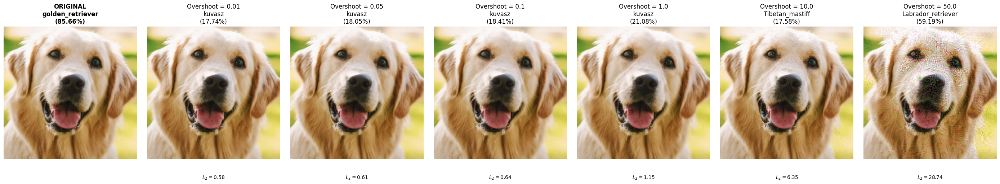

--- Target Image: Lion ---


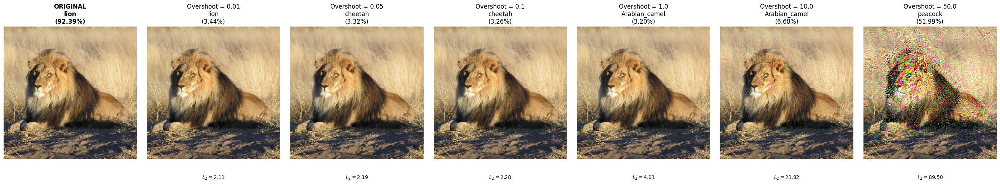


EXECUTING DEEPFOOL ATTACKS ON MODEL: EfficientNetB0

--- Target Image: Dog ---


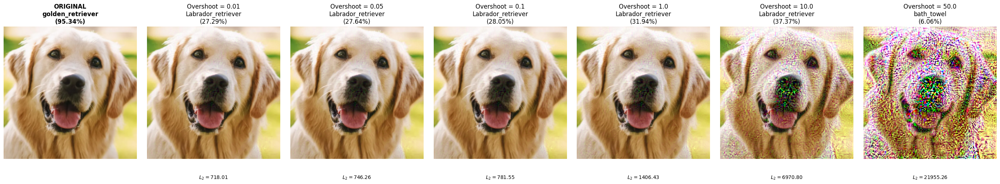

--- Target Image: Lion ---


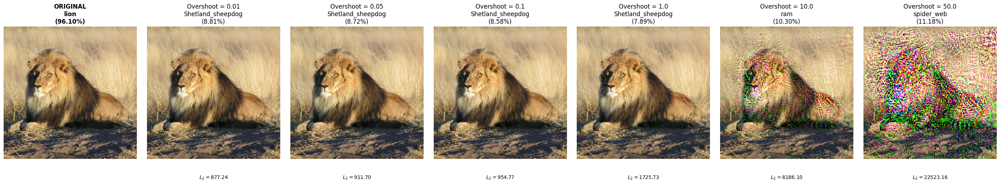


EXECUTING DEEPFOOL ATTACKS ON MODEL: InceptionV3

--- Target Image: Dog ---


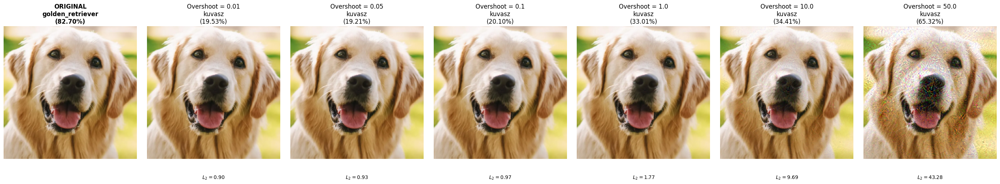

--- Target Image: Lion ---


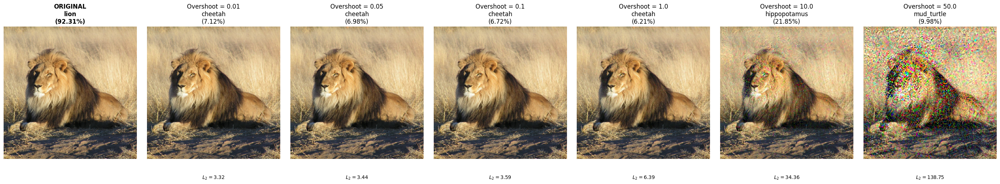

In [5]:
# Array of overshoot values based on your previous tests
overshoots = [0.01, 0.05, 0.1, 1.0, 10.0, 50.0]
num_cols = len(overshoots) + 1 # +1 to include the original image as a baseline

for model_name, m_config in models_dict.items():
    # Print a clear header when switching models
    print(f"\n{'='*80}")
    print(f"EXECUTING DEEPFOOL ATTACKS ON MODEL: {model_name}")
    print(f"{'='*80}\n")
    
    current_model = m_config['model']
    target_size = m_config['target_size']
    preprocess_fn = m_config['preprocess_fn']
    decode_fn = m_config['decode_fn']
    denormalize_fn = m_config['denormalize_fn'] # Dynamic denormalization function
    clip_min = m_config['clip_min']
    clip_max = m_config['clip_max']
    
    for img_name, img_path in images_dict.items():
        print(f"--- Target Image: {img_name} ---")
        
        # Create a new figure for this specific model and image (1 row, 7 columns)
        fig, axes = plt.subplots(1, num_cols, figsize=(4 * num_cols, 4.5))
        fig.subplots_adjust(wspace=0.1)
        
        # Load and Preprocess
        input_img = load_and_preprocess_image(img_path, target_size, preprocess_fn)
        
        # Get Original Prediction
        original_probs = current_model.predict(input_img, verbose=0)
        _, orig_class_name, orig_prob = get_imagenet_label(original_probs, decode_fn)
        
        # Plot Original Image in the first column
        ax_orig = axes[0]
        ax_orig.imshow(denormalize_fn(input_img)) # Apply specific denormalization
        ax_orig.set_title(f'ORIGINAL\n{orig_class_name}\n({orig_prob * 100:.2f}%)', fontweight='bold')
        ax_orig.axis('off')
        
        # Iterate over overshoot values
        for col_idx, overshoot_val in enumerate(overshoots, start=1):
            
            # Execute DeepFool Attack
            adv_img = deepfool_attack(input_img, current_model, clip_min, clip_max, num_classes=10, overshoot=overshoot_val, max_iter=50) 
            
            # Calculate L2 Distance
            l2 = euclidean_distance(input_img, adv_img)
            
            # Get Adversarial Prediction
            adv_img_probs = current_model.predict(adv_img, verbose=0)
            _, adv_img_class, adv_class_prob = get_imagenet_label(adv_img_probs, decode_fn)
            
            # Plot Adversarial Image
            ax = axes[col_idx]
            ax.imshow(denormalize_fn(adv_img)) 
            ax.set_title(f'Overshoot = {overshoot_val}\n{adv_img_class}\n({adv_class_prob * 100:.2f}%)')
            ax.text(0.5, -0.15, f'$L_2={l2:.2f}$', transform=ax.transAxes, ha='center', fontsize=10)
            ax.axis('off')
            
        plt.tight_layout()
        plt.show()